In [1]:
from math import sin, cos, sqrt, atan2, radians
from matplotlib import pyplot as plt
from matplotlib.pyplot import imshow
from joblib import Parallel, delayed
#import seaborn as sns; sns.set()
from tqdm.notebook import tqdm
from shutil import copyfile
from scipy import spatial
import multiprocessing
import networkx as nx
from PIL import Image
import pandas as pd
import numpy as np
import imagehash
import hashlib
import time
import glob
import cv2
import os

# Distance Between Ads

In [149]:
def calcDistance(lat1, lon1, lat2, lon2):
    """
    Returns distance in KM
    """
    # approximate radius of earth in km
    R = 6373.0

    dlon = radians(lon2) - radians(lon1)
    dlat = radians(lat2) - radians(lat1)

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    return R * c

def iterDistance(key, lat, lng, df):
    """
    Calc distance between coordinates provided,
    and each row entry within the provided df.
    """
    dist = []
    for _, row in df.iterrows():
        dist.append({'key1':key, 
                     'key2':row['key'],
                     'dist':calcDistance(lat, lng, row['lat'], row['lng'])})
    pd.DataFrame(dist).to_csv('./dist/'+key+'.csv')

In [150]:
def calcDistanceBetweenAds():
    """
    Calc distances for each ad in parallel 
    """
    ads = pd.read_csv('ads_with_gps.csv')        
    num_cores = multiprocessing.cpu_count()-1
    Parallel(n_jobs=num_cores)(delayed(iterDistance)(row['key'], row['lat'], row['lng'], ads) for _, row in tqdm(ads.iterrows(), total=ads.shape[0]))

In [7]:
def concat():
    """
    Concat csv files in ./dist
    """
    all_files = glob.glob(os.path.join('./dist', "*.csv"))
    df = pd.concat((pd.read_csv(f) for f in all_files), ignore_index=True)
    df.to_csv("concat.csv")
    
def readConcat():
    return pd.read_csv("concat.csv")

In [8]:
df = readConcat()

In [9]:
dist=0.1
df_sd = df[df.dist < dist]
#df_sd.to_csv("concat_sd.csv")

# Feature Matching 

In [13]:
def featureMatching(path1, path2, key1, key2, save=True):
    img1 = cv2.imread(path1,0)          # queryImage
    img2 = cv2.imread(path2,0) # trainImage

    # Initiate SIFT detector
    #sift = cv2.SIFT()
    sift = cv2.xfeatures2d.SIFT_create()

    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    good = []

    if len(kp1) > 0 and len(kp2) > 0:
        # BFMatcher with default params
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2, k=2)

        # Apply ratio test
        thresh = 0.7
        for m,n in matches:
            if m.distance < thresh*n.distance:
                good.append([m])

        if save:
            # cv2.drawMatchesKnn expects list of lists as matches.
            if len(good) > 50:
                img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=2)
                plt.imshow(img3)
                plt.title("Matches: " + str(len(good)))
                plt.axis('off')
                plt.savefig('plots/'+key1 + '_'+ key2 + '.png', dpi=300)
                plt.show()
    return len(good)    

In [14]:
def getKey(key):
    key = key.split('_')[:-1]
    return key[0] + '_' + key[1] + '_' + key[2]

def isWithinDist(key1, key2, df):
    return (len(df[df['key2'].str.contains(key2)])>0)

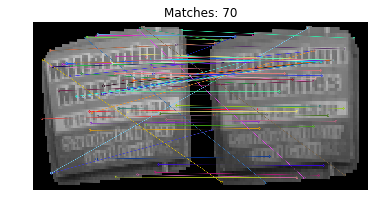

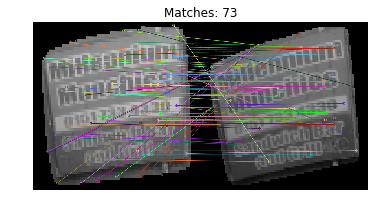

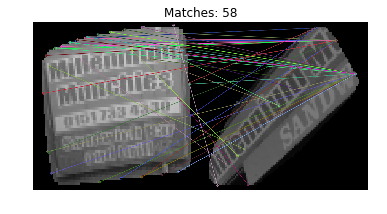

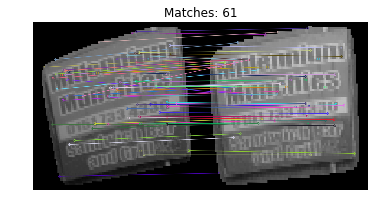

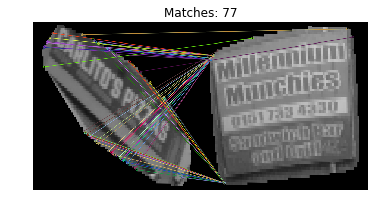

...

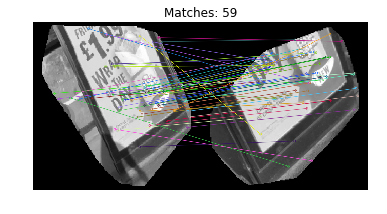

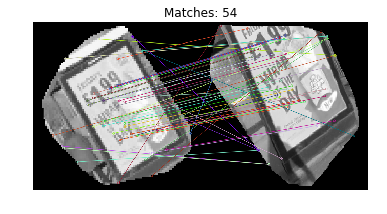

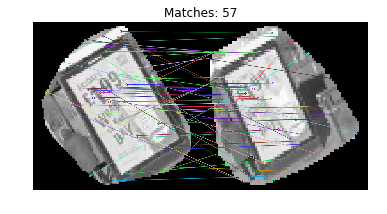

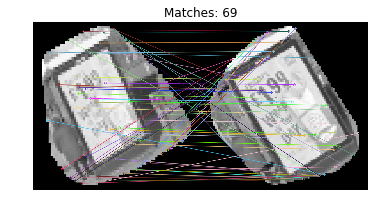

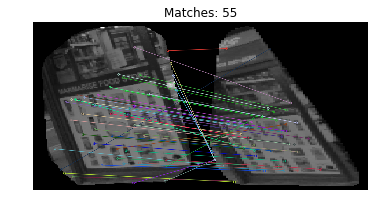

KeyboardInterrupt: 

In [15]:
def processImgs(img1, path, df_sd):
    sim = []
    key1 = getKey(img1)
    df_sd = df_sd[df_sd['key1'].str.contains(key1)]
    p1 = path + img1
    for img2 in os.listdir(path):
        key2 = getKey(img2)
        if img1 != img2 and isWithinDist(key1, key2, df_sd):
            p2 = path + img2
            sim.append({'img1':p1,
                        'img2':p2,
                        'dist':df_sd[df_sd['key2'].str.contains(getKey(img2))].dist.unique()[0],
                        'simFeatures':featureMatching(p1, p2, key1, key2)})
            
    #pd.DataFrame(sim).to_csv('./features/'+path+'/'+img1.replace('.png', '')+'.csv')
    
#paths = ['../labelled_ads/alc/', '../labelled_ads/gambling/', '../labelled_ads/food/']
paths = ['../labelled_ads/food/']
for path in paths:
    for img1 in tqdm(os.listdir(path)):
        processImgs(img1, path, df_sd)

# Parallel Processing
#path = './other/'        
#num_cores = multiprocessing.cpu_count()-1
#Parallel(n_jobs=num_cores)(delayed(processImgs)(img1, path, df_sd, dist=dist) for img1 in tqdm(os.listdir(path), total=len(os.listdir(path))))        

In [226]:
def concatFeatureCSVs(path):
    # Concat csv files in ./dist
    all_files = glob.glob(os.path.join('./features/'+path+'/', "*.csv"))
    df = pd.concat((pd.read_csv(f) for f in all_files), ignore_index=True)
    df.to_csv(path+"_concat.csv")
    
paths = ['other', 'gambling', 'food', 'alc']
for path in tqdm(paths):
    concatFeatureCSVs(path)

In [156]:
def makeDir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

In [157]:
def identifySimAdsClusters(cat, thresh=40, dist=0.1, adsPath='./'):
    df = pd.read_csv(cat+"_concat.csv")
    non_dupes = glob.glob(os.path.join(adsPath+cat+'/', "*.png")) # Initially assume no dupes exist
    clusters = []
    gps = pd.read_csv('ads_with_gps.csv')  
    G = nx.from_pandas_edgelist(df[(df.simFeatures > thresh) & (df.dist < dist)], 'img1', 'img2')
    plt.show()
    graphs = list(nx.connected_component_subgraphs(G))
    count = 0
    dupes = 0
    largeClusters = 0
    for g in graphs:
        #print(len(g))
        if len(g) > 10:
            largeClusters += 1
        dupes += len(g)
        coordinates = []
        current_cluster = []
        for path in g.nodes:
            non_dupes.remove(path) # Remove from "clean" list
            row = gps[gps.key == getKey(path.replace(adsPath+cat+'/', ''))]
            current_cluster.append({'key':getKey(path.replace(adsPath+cat+'/', '')),
                             'path':path,
                             'lat':row.lat.unique()[0],
                             'lng':row.lng.unique()[0],                             
                             'cid':count,
                             'center':False})
            coordinates.append([row.lat.unique()[0], row.lng.unique()[0]])
        pt = np.array(coordinates).mean(axis=0)  # <-- the point to find
        current_cluster[spatial.KDTree(coordinates).query(pt)[1]].update({'center':True})
        clusters = clusters + current_cluster
        count += 1
    individuals = []
    for path in non_dupes:
        row = gps[gps.key == getKey(path.replace(adsPath+cat+'/', ''))]
        individuals.append({'key':getKey(path.replace(adsPath+cat+'/', '')),
                            'path':path.replace(adsPath+cat+'/', 'Results/'),
                            'lat':row.lat.unique()[0],
                            'lng':row.lng.unique()[0],                             
                            'cid':count,
                            'center':True})
        count += 1
    df = pd.DataFrame(clusters + individuals)
    #print(df.groupby('cid').count())
    #for path in df[df.center == True].path.to_list():
    #    copyfile(path, './clean/'+path)
    #for path, cid in zip(df.path.to_list(), df.cid.to_list()):
    #    copyfile(path, './clean/'+path.replace('.png', '_'+str(cid)+'.png')) 
    directory = './clean/'+cat+'/'+str(thresh)+'/'
    makeDir(directory)
    for cid in df.cid.unique():
        #print(len(df[df.cid == cid]))
        if len(df[df.cid == cid]) > 15:
            cidDir = directory +str(cid)+'/'
            makeDir(cidDir)
            for imgPath in df[df.cid == cid].path.to_list():
                copyfile(imgPath, cidDir+imgPath.replace('./'+cat, ''))
        
    df[df.center == True].to_csv(cat + "_gps.csv")
    return df[df.center == True], largeClusters

In [229]:
paths = ['food', 'alc', 'gambling', 'other']
dist = 0.01 #.1
#thresholds = [x for x in range(10, 100, 10)]
thresh = 60
dfs = []
#for thresh in thresholds:
for path in tqdm(paths):
    dfs.append(identifySimAdsClusters(path, dist=dist, thresh=thresh)[0])
    
pd.concat(dfs).to_csv("ads_after_simcheck.csv")

In [224]:
dists = [.1, .2, .3, .4, .5]
thresholds = [10, 20, 30, 40, 50, 60, 70, 80]
paths = ['food', 'alc', 'gambling']
cats = []
#for path in ['food']#, 'alc', 'gambling']:
for path in paths:
    uniques = []
    for dist in dists:
        for thresh in thresholds:
            df, largeClusters = identifySimAdsClusters(path, dist=dist, thresh=thresh)
            uniques.append({'dist':dist,
                            'thresh':thresh,
                            'unique':len(df),
                            'largeClusters':largeClusters})
    cats.append(uniques)

# Eval

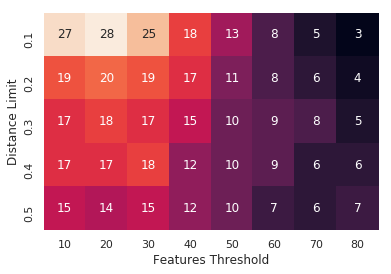

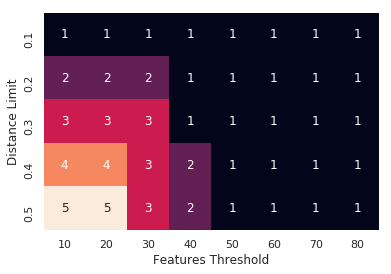

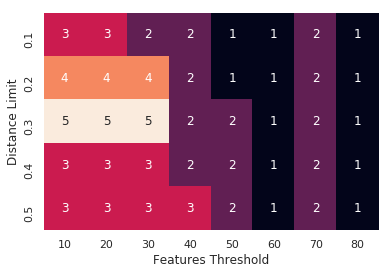

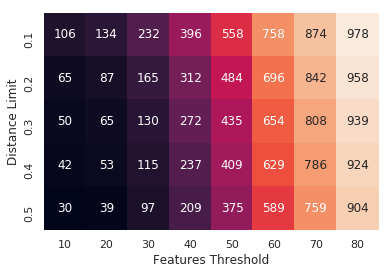

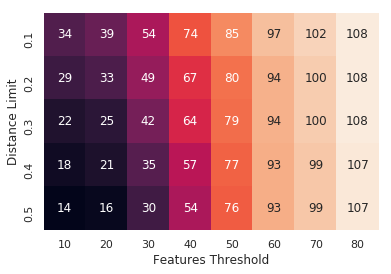

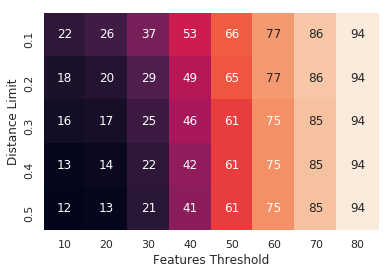

In [225]:
for cat in cats:   
    df = pd.DataFrame(cat).pivot("dist", "thresh", "largeClusters")
    ax = sns.heatmap(df, annot=True, fmt="d", cbar=False)
    plt.xlabel("Features Threshold")
    plt.ylabel("Distance Limit")
    plt.show()
    
for cat in cats:   
    df = pd.DataFrame(cat).pivot("dist", "thresh", "unique")
    ax = sns.heatmap(df, annot=True, fmt="d", cbar=False)
    plt.xlabel("Features Threshold")
    plt.ylabel("Distance Limit")
    plt.show()    

In [44]:
#gt = glob.glob(os.path.join('./Clusters', "*.csv"))
gt = {}
for folder in glob.glob("./Clusters/*"):
    gt.update({folder.replace('./Clusters/',''):[x.replace(folder+'/', '') for x in glob.glob(os.path.join(folder, "*.png"))]})

In [227]:
legend = {'PigAndWhistle':'Pub Sign', 
          'BurgerAd':'Hamburger Ad',
          'FreddysChicken':'Takeaway',
          'McDonaldsGoldenArch':'Golden Arch'}
cat = 'food'
results = []
for dist in [10, 100]:
    for key in gt:
        if key == 'PigAndWhistle':
            cat = 'alc'
        else:
            cat = 'food'
        #print(key)
        tp = []
        fp = []
        for i in range(10, 100, 10):
            #print('./clean/'+cat+'/'+str(i)+'/'+key+'/')
            files = glob.glob(os.path.join('./clean/dist_'+str(dist)+'m/'+cat+'/'+str(i)+'/'+key+'/', "*.png"))
            files = [x.replace('./clean/dist_'+str(dist)+'m/'+cat+'/'+str(i)+'/'+key+'/', '') for x in files]
            results.append({'key':key, 
                            'legend':legend[key],
                            'thresh':i,
                            'dist':dist,
                            'tp':len(list(set(gt[key]) & set(files))), 
                            'fp':len(list(set(files) - set(gt[key])))})

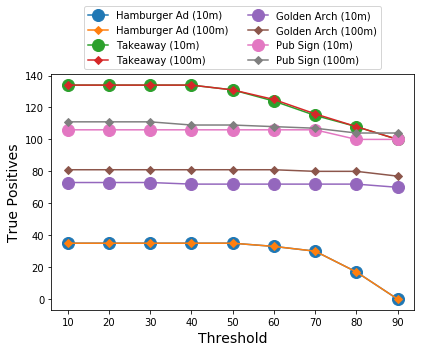

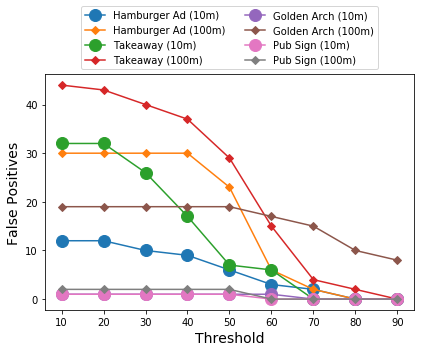

In [228]:
df = pd.DataFrame(results)
#df = df.pivot(index='thresh', columns='key', values='tp')
#df.plot(kind='scatter', x='thresh', y='tp')

groups1 = df[df.dist == 10].groupby('key')
groups2 = df[df.dist == 100].groupby('key')
# Plot
fig, ax = plt.subplots(figsize=(6,5))
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for [name1, group1], [name2, group2] in zip(groups1, groups2):
    ax.plot(group1.thresh, group1.tp, marker='o', linestyle='-', ms=12, label=group1.legend.unique()[0] + ' (10m)')
    ax.plot(group2.thresh, group2.tp, marker='D', linestyle='-', ms=5, label=group2.legend.unique()[0] + ' (100m)')
#ax.legend()
plt.xlabel('Threshold', fontsize=14)
plt.ylabel('True Positives', fontsize=14)
plt.legend(fontsize=10, loc='lower center', ncol=2, bbox_to_anchor=(0.5, 1.))
plt.tight_layout()
plt.savefig('plots/tp.png', dpi=300)
plt.show()

fig, ax = plt.subplots(figsize=(6,5))
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for [name1, group1], [name2, group2] in zip(groups1, groups2):    
    ax.plot(group1.thresh, group1.fp, marker='o', linestyle='-', ms=12, label=group1.legend.unique()[0] + ' (10m)')
    ax.plot(group2.thresh, group2.fp, marker='D', linestyle='-', ms=5, label=group2.legend.unique()[0] + ' (100m)')
plt.xlabel('Threshold', fontsize=14)
plt.ylabel('False Positives', fontsize=14)
plt.legend(fontsize=10, loc='lower center', ncol=2, bbox_to_anchor=(0.5, 1.))
plt.tight_layout()
plt.savefig('plots/fp.png', dpi=300)
plt.show()

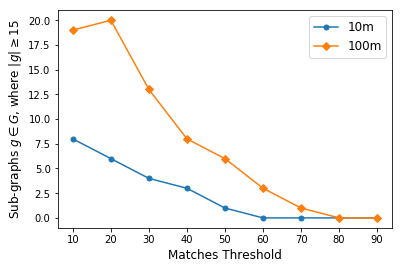

In [212]:
mixedFolders10 = []
mixedFolders100 = []
for i in range(10, 100, 10):
    mixedFolders10.append({'thresh':i, 
                         'folders':len(glob.glob("./clean/dist_10m/food_mixed_clusters/"+str(i)+"/*"))})
    mixedFolders100.append({'thresh':i, 
                         'folders':len(glob.glob("./clean/dist_100m/food_mixed_clusters/"+str(i)+"/*"))})
    
df_mixed10 = pd.DataFrame(mixedFolders10)
df_mixed100 = pd.DataFrame(mixedFolders100)
fig, ax = plt.subplots()
ax.plot(df_mixed10.thresh, df_mixed10.folders, marker='o', linestyle='-', ms=5, label='10m')
ax.plot(df_mixed100.thresh, df_mixed100.folders, marker='D', linestyle='-', ms=5, label='100m')
plt.xlabel('Matches Threshold', fontsize=12)
plt.ylabel(r'Sub-graphs $g \in G$, where $|g| \geq 15$', fontsize=12)
plt.legend(fontsize=12)
plt.savefig('plots/mixed_clusters.png', dpi=300)